<a href="https://colab.research.google.com/github/MateusFonseK/haarcascade_detection/blob/main/haarcascade_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Imports

In [8]:
import cv2

##Upload image

In [11]:
from google.colab import drive
drive.mount('/content/drive')

image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Images/people.jpg')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [12]:
image.shape

(1280, 1920, 3)

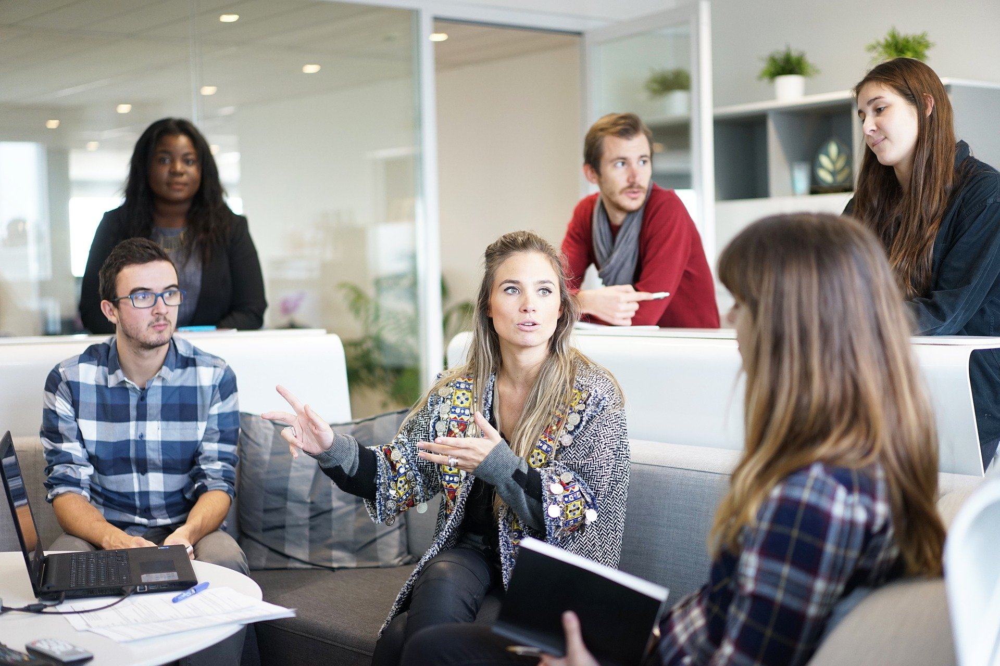

In [13]:
from google.colab.patches import cv2_imshow
cv2_imshow(image)

##Preprocessing


Size Reduction and Grayscale Conversion for Optimization




In [14]:
image = cv2.resize(image,(800,600))
image.shape

(600, 800, 3)

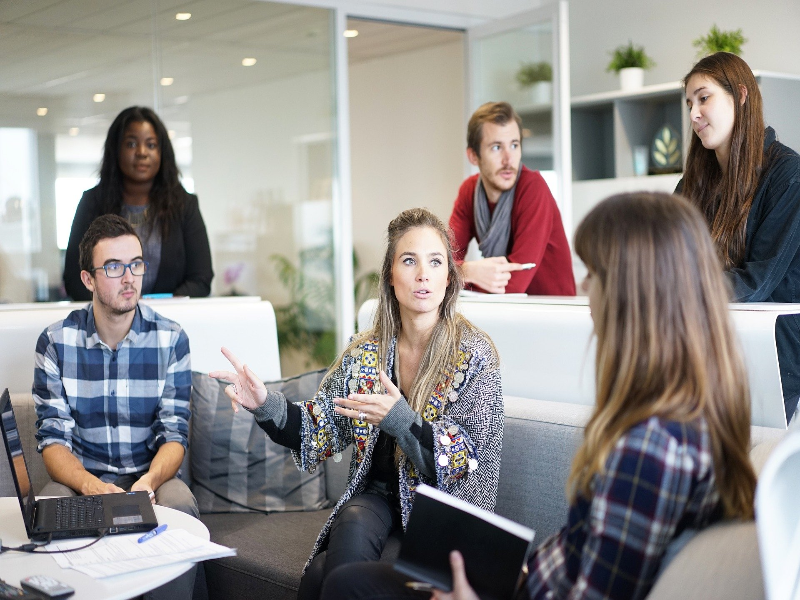

In [15]:
cv2_imshow(image)

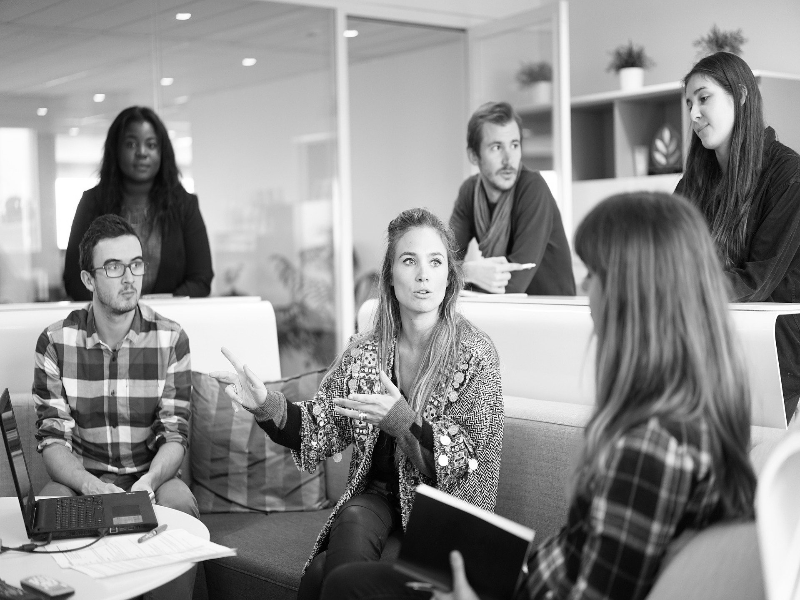

In [16]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

##**Facial Detection**

In [17]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Cascades/haarcascade_frontalface_default.xml')

In [18]:
detections = face_detector.detectMultiScale(image_gray)

detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

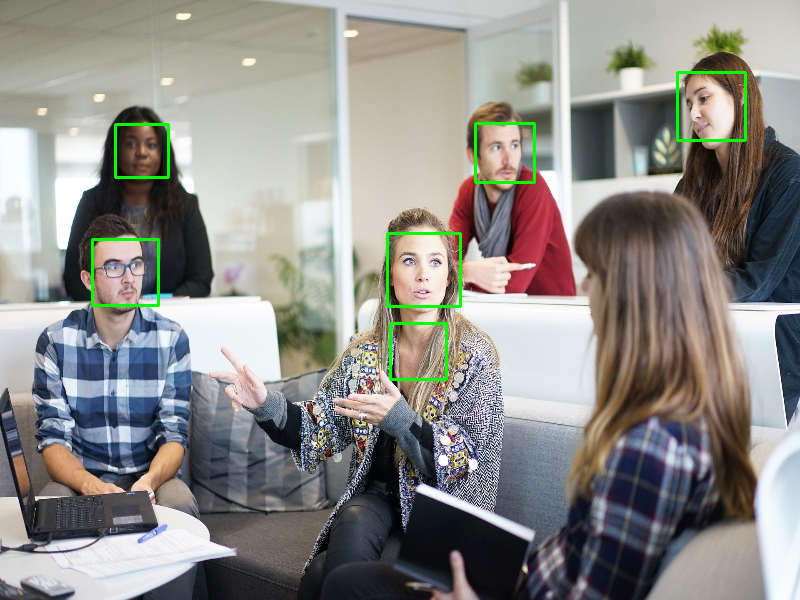

In [19]:
for x, y, w, h in detections:
  cv2.rectangle(image, (x,y), (x + w, y + h), (0,255,0), 2)

cv2_imshow(image)

Solving false positive problem with `scaleFactor`

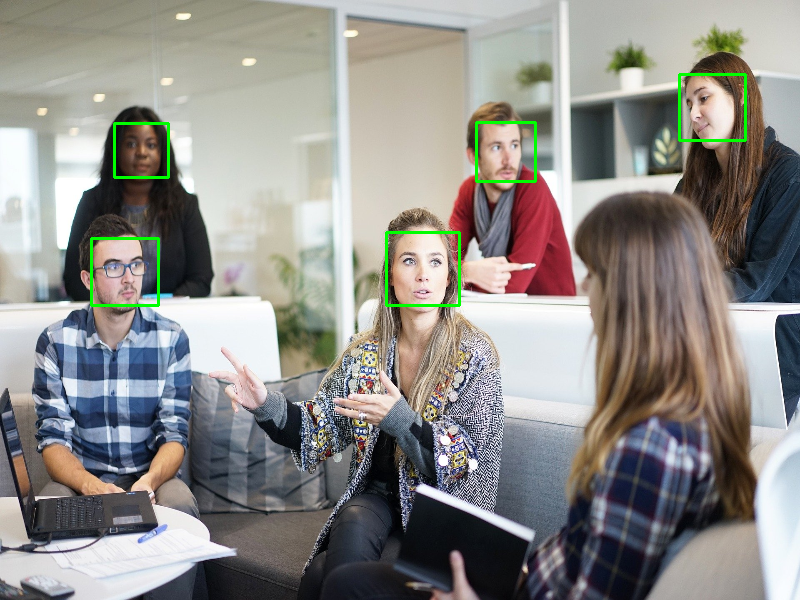

In [20]:
new_image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Images/people.jpg')
new_image = cv2.resize(new_image,(800,600))

detections_scalefactor = face_detector.detectMultiScale(image_gray, scaleFactor=1.075)

for x, y, w, h in detections_scalefactor:
  cv2.rectangle(new_image, (x,y), (x + w, y + h), (0,255,0), 2)

cv2_imshow(new_image)

###Facial Detection with more peoples



*   `minNeighbors` sets the required nearby detections for validation
*   `minSize` defines the minimum object size



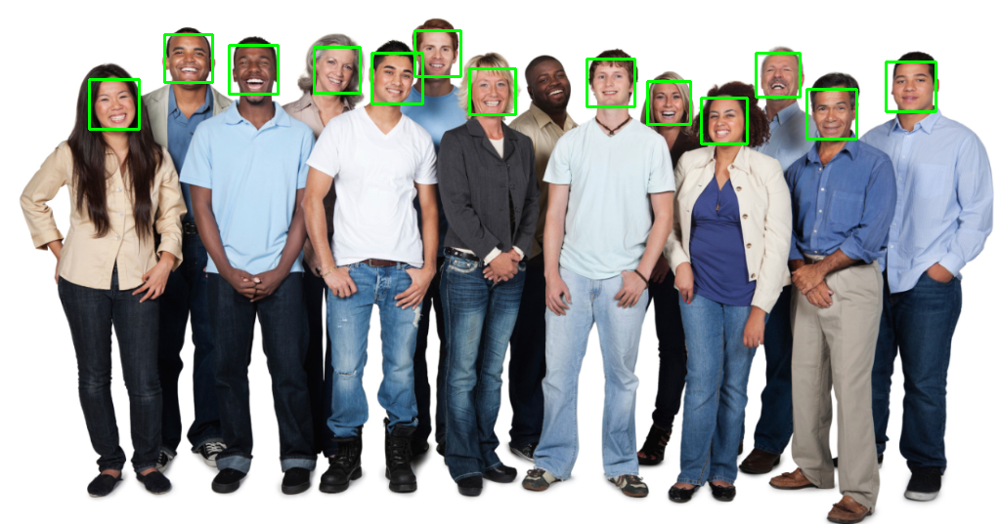

In [21]:
image2 = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Images/people2.jpg')
image2_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

detections2 = face_detector.detectMultiScale(image2_gray, scaleFactor=1.2, minNeighbors=3, minSize=(32,32))

for x, y, w, h in detections2:
  cv2.rectangle(image2, (x,y), (x + w, y + h), (0,255,0), 2)

cv2_imshow(image2)

##**Eye Detection**

In [22]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Cascades/haarcascade_eye.xml')

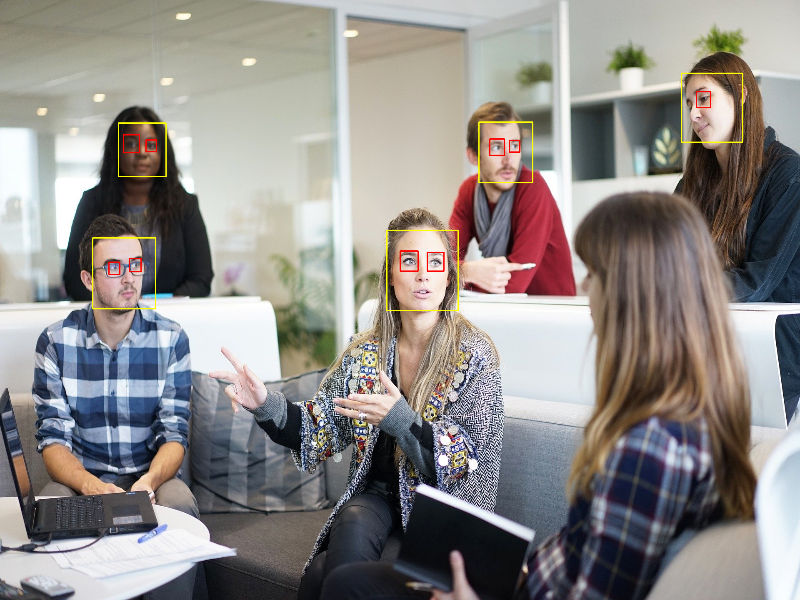

In [23]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Images/people.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#Face Detection
face_detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.3, minSize=(30,30))
for x, y, w, h in face_detections:
  cv2.rectangle(image, (x,y), (x + w, y + h), (0,255,255), 2)

#Eye Detection
eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor=1.2, maxSize=(60,60))
for x, y, w, h in eye_detections:
  cv2.rectangle(image, (x,y), (x + w, y + h), (0,0,255), 2)


image = cv2.resize(image, (800, 600))
cv2_imshow(image)

##**Car Detection**

In [24]:
car_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Cascades/cars.xml')

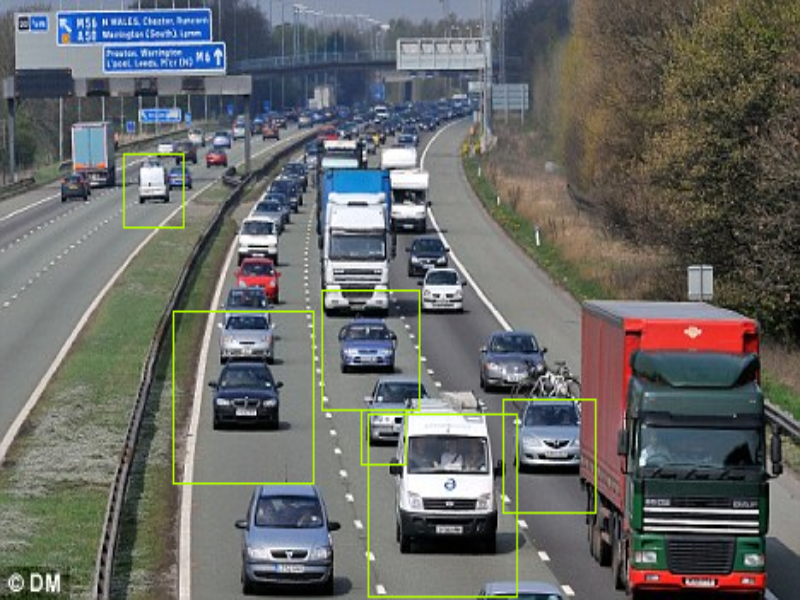

In [25]:
image_car = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Images/car.jpg')
image_car_gray = cv2.cvtColor(image_car, cv2.COLOR_BGR2GRAY)


car_detections = car_detector.detectMultiScale(image_car_gray, scaleFactor=1.04, minNeighbors=5)
for x, y, w, h in car_detections:
  cv2.rectangle(image_car, (x,y), (x + w, y + h), (0,250,180), 1)

image_car = cv2.resize(image_car, (800, 600))
cv2_imshow(image_car)

##**Clock Detection**

In [26]:
clock_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Cascades/clocks.xml')

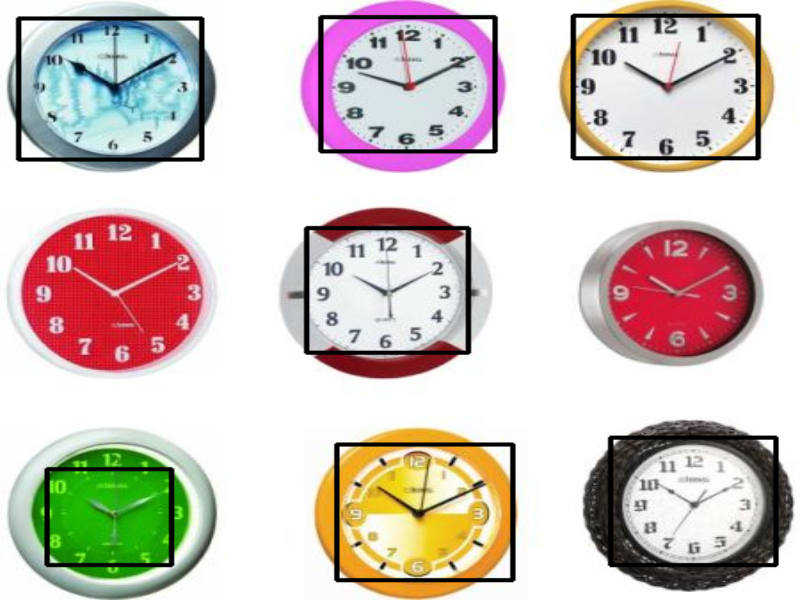

In [27]:
image_clock = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Images/clock.jpg')
image_clock_gray = cv2.cvtColor(image_clock, cv2.COLOR_BGR2GRAY)


clock_detections = clock_detector.detectMultiScale(image_clock_gray, scaleFactor=1.03, minNeighbors=1)
for x, y, w, h in clock_detections:
  cv2.rectangle(image_clock, (x,y), (x + w, y + h), (0,0,0), 2)

image_clock = cv2.resize(image_clock, (800, 600))
cv2_imshow(image_clock)

##**Fullbody Detection**

In [28]:
fullbody_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Cascades/fullbody.xml')

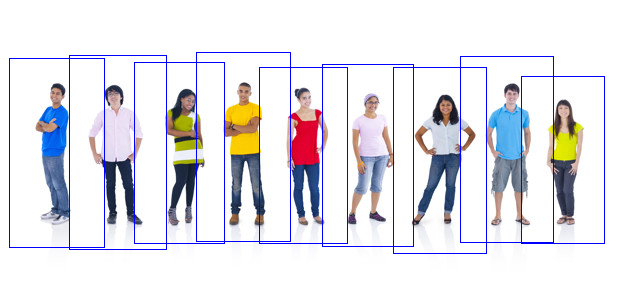

In [29]:
image_fullbody = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Haarcascade_detection/Images/people3.jpg')
image_fullbody_gray = cv2.cvtColor(image_fullbody, cv2.COLOR_BGR2GRAY)
image_fullbody_gray = cv2.GaussianBlur(image_fullbody_gray, (9, 9), 0)


fullbody_detections = fullbody_detector.detectMultiScale(image_fullbody_gray, scaleFactor=1.002, minSize=(80,80))
for x, y, w, h in fullbody_detections:
  cv2.rectangle(image_fullbody, (x,y), (x + w, y + h), (255,0,0), 1)

cv2_imshow(image_fullbody)